# 0.IMPORTS

## 0.1. Importing libraries

In [371]:
import pandas as pd
#import ydata_profiling
import matplotlib.pyplot as plt
import math
import seaborn as sns
from sklearn               import preprocessing as pp
from sklearn               import ensemble as en
from sklearn               import model_selection as ms
import numpy as np
from sklearn.linear_model import LinearRegression,Lasso,ElasticNet,Ridge
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from datetime import datetime, timedelta
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import random

## 0.2. Loading data

In [478]:
stores         = pd.read_csv('test-hackday-7/stores.csv', low_memory=False)
train          = pd.read_csv('test-hackday-7/train.csv', low_memory=False)
train_features = pd.read_csv('test-hackday-7/train_features.csv', low_memory=False)

test = pd.read_csv('test-hackday-7/test.csv', low_memory=False)
test_features = pd.read_csv('test-hackday-7/test_features.csv', low_memory=False)

## 0.3. Helper functions

In [479]:
# Função para renomear as colunas do dataframe
def rename_columns(cols):
    cols = list(map(lambda x: inflection.titleize(x), cols))
    cols = list(map(lambda x: x.replace(" ", ""), cols))
    cols = list(map(lambda x: x.replace(".", ""), cols))
    cols = list(map(lambda x: inflection.underscore(x), cols))
    return cols

# Função que retorna uma tabela de únicos e suas respectivas quantidades
def tab_unique(df):
    tab_unicos = pd.DataFrame(df.nunique())
    tab_unicos.columns= ['count']
    tab_unicos['content'] = df.apply(lambda x: x.unique())
    return tab_unicos

In [480]:
def cross_validation(x_training,kfold,model_name,model,verbose=False):
    rmse_list = []
    for k in reversed(range(1,kfold+1)):
        if verbose:
            print(f'K = {k}')
        validation_start_date = x_training['data'].max() - timedelta(days=k*6*7)
        validation_end_date = x_training['data'].max() - timedelta(days=(k-1)*6*7)

        #Filtrar o dataset
        training = x_training[x_training['data'] < validation_start_date] #Resto dos dados
        validation = x_training[(x_training['data'] >= validation_start_date) & (x_training['data'] <= validation_end_date)] #Começo até o início do treino

        training_start = training['data'].max()
        training_end = training['data'].min()

        validation_start = validation['data'].max()
        validation_end = validation['data'].min()

        #Training and validation dataset
        #training
        xtraining = training.drop(['data','vendas_semanais','id'],axis=1)
        ytraining = training['vendas_semanais']

        #validation
        xvalidation = validation.drop(['data','vendas_semanais','id'],axis=1)
        yvalidation = validation['vendas_semanais']

        #Como fizemos para selecionar as variáveis para o Boruta
        #Estamos selecionando os datasets de treino e validação

        #model
        m = model.fit(xtraining,ytraining)

        #prediction
        yhat = m.predict(xvalidation)

        #performance - Y_test é a coluna de sales que devemos encontrar e yhat é o que nosso método prediz
        rmse = np.sqrt(mean_squared_error(np.expm1(yvalidation), np.expm1(yhat)))

        #Guardando a performance de cada iteração
        rmse_list.append(rmse)

    return pd.DataFrame({'Model Name':model_name,
         'RSME CV':np.round(np.mean(rmse_list),2).astype(str) + ' +/- ' + np.round(np.std(rmse_list),2).astype(str)},index=[0])

## 0.4. Dicionário de dados

# 1. DATA DESCRIPTION

## 1.1. Unir tabelas

In [532]:
df = pd.merge(train, stores, on='loja', how='inner')
df1 = pd.merge(df, train_features, on=['loja', 'data', 'feriado'], how='inner')

df_test = pd.merge(test, stores, on='loja', how='inner')
df_teste = pd.merge(df_test, test_features, on=['loja', 'data', 'feriado'], how='inner')

## 1.2. Data Dimensions

In [533]:
df1.head()

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes
0,140679,17,93,01-07,6283.00,nao,eletronico,93188.0,-14.316667,2.891,NaN,NaN,NaN,NaN,NaN,0.06866,NaN,541
1,140696,17,16,01-07,1641.25,nao,eletronico,93188.0,-14.316667,2.891,NaN,NaN,NaN,NaN,NaN,0.06866,NaN,541
2,140701,17,4,01-07,39775.45,nao,eletronico,93188.0,-14.316667,2.891,NaN,NaN,NaN,NaN,NaN,0.06866,NaN,541
3,140733,17,14,01-07,29555.43,nao,eletronico,93188.0,-14.316667,2.891,NaN,NaN,NaN,NaN,NaN,0.06866,NaN,541
4,140742,17,48,01-07,414.00,nao,eletronico,93188.0,-14.316667,2.891,NaN,NaN,NaN,NaN,NaN,0.06866,NaN,541


In [534]:
print('Quantidade de linhas: {:,}'.format(df1.shape[0]))
print('Quantidade de colunas: {:,}'.format(df1.shape[1]))

Quantidade de linhas: 135,385
Quantidade de colunas: 18


## 1.3. Check NA's

In [535]:
df1.isna().sum()

id                             0
loja                           0
setor                          0
data                           0
vendas_semanais            12862
feriado                        0
tipo                           0
tamanho                    33327
temperatura                47945
combustivel                52989
desconto_1                129459
desconto_2                129510
desconto_3                129746
desconto_4                130184
desconto_5                129459
desemprego                     0
distancia_competidores    129459
clientes                       0
dtype: int64

In [536]:
stores.isna().sum()

loja        0
tipo        0
tamanho    11
dtype: int64

In [537]:
stores['loja'].nunique()

45

## 1.4. Data Types

## 1.5. Check duplicated

## 1.6. Datetime

# 2. TRATAMENTO E FEATURE ENGINEERING

In [538]:
df2 = df1.copy()

## 2.1. Criação das Hipóteses

## 2.2. Transformar e converter

### 2.2.1. Preencher NA´s

#### 2.2.1.1. Excluir os registros com vendas semanais nula

In [539]:
reg_faltantes = df2.loc[(df2['vendas_semanais'].isna()) | (df2['vendas_semanais'] < 1), :].index
df2.drop(reg_faltantes, axis=0, inplace=True)

#Testar com 10

In [540]:
df2.reset_index(inplace=True,drop=True)
df2.tail()

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes
121991,275307,33,90,11-18,23462.71,nao,eletrodomestico,39690.0,NaN,3.669,86.59,6.0,NaN,NaN,3220.86,0.0801,1952.0,156
121992,275374,33,96,11-18,10445.16,nao,eletrodomestico,39690.0,NaN,3.669,86.59,6.0,NaN,NaN,3220.86,0.0801,1952.0,156
121993,275387,33,95,11-18,25464.21,nao,eletrodomestico,39690.0,NaN,3.669,86.59,6.0,NaN,NaN,3220.86,0.0801,1952.0,156
121994,275397,33,98,11-18,7730.53,nao,eletrodomestico,39690.0,NaN,3.669,86.59,6.0,NaN,NaN,3220.86,0.0801,1952.0,156
121995,275405,33,97,11-18,4665.16,nao,eletrodomestico,39690.0,NaN,3.669,86.59,6.0,NaN,NaN,3220.86,0.0801,1952.0,156


#### 2.2.1.2. Preencher os descontos com valores nulos com 0

In [541]:
df2['desconto_1'] = df2['desconto_1'].fillna(0)
df2['desconto_2'] = df2['desconto_2'].fillna(0)
df2['desconto_3'] = df2['desconto_3'].fillna(0)
df2['desconto_4'] = df2['desconto_4'].fillna(0)
df2['desconto_5'] = df2['desconto_5'].fillna(0)

df_teste['desconto_1'] = df_teste['desconto_1'].fillna(0)
df_teste['desconto_2'] = df_teste['desconto_2'].fillna(0)
df_teste['desconto_3'] = df_teste['desconto_3'].fillna(0)
df_teste['desconto_4'] = df_teste['desconto_4'].fillna(0)
df_teste['desconto_5'] = df_teste['desconto_5'].fillna(0)

#### 2.2.1.3. Preencher o tamanho das lojas faltantes com a mediana

In [542]:
mediana = df2['tamanho'].median()
mediana

128107.0

In [543]:
tam_faltantes = df2.loc[df2['tamanho'].isna(), :].index

tam_faltantes2 = df_teste.loc[df_teste['tamanho'].isna(), :].index

In [544]:
%%time
df2['tamanho'] = df2['tamanho'].apply(lambda x: mediana if math.isnan(x) else x)

df_teste['tamanho'] = df_teste['tamanho'].apply(lambda x: mediana if math.isnan(x) else x)

CPU times: total: 46.9 ms
Wall time: 51 ms


In [545]:
df2.iloc[tam_faltantes, :]

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes
5623,140681,3,25,01-07,2658.57,nao,eletronico,128107.0,11.861111,NaN,0.00,0.00,0.0,0.00,0.0,0.07551,NaN,901
5624,141029,3,20,01-07,1358.81,nao,eletronico,128107.0,11.861111,NaN,0.00,0.00,0.0,0.00,0.0,0.07551,NaN,901
5625,141077,3,34,01-07,3280.50,nao,eletronico,128107.0,11.861111,NaN,0.00,0.00,0.0,0.00,0.0,0.07551,NaN,901
5626,141106,3,23,01-07,6530.88,nao,eletronico,128107.0,11.861111,NaN,0.00,0.00,0.0,0.00,0.0,0.07551,NaN,901
5627,141169,3,19,01-07,3113.76,nao,eletronico,128107.0,11.861111,NaN,0.00,0.00,0.0,0.00,0.0,0.07551,NaN,901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120106,274985,11,71,11-18,9419.43,nao,eletrodomestico,128107.0,NaN,NaN,10941.05,222.94,263.1,404.05,8885.3,0.07197,17997.0,953
120107,274997,11,67,11-18,9790.06,nao,eletrodomestico,128107.0,NaN,NaN,10941.05,222.94,263.1,404.05,8885.3,0.07197,17997.0,953
120108,275011,11,79,11-18,26994.74,nao,eletrodomestico,128107.0,NaN,NaN,10941.05,222.94,263.1,404.05,8885.3,0.07197,17997.0,953
120109,275018,11,74,11-18,18686.63,nao,eletrodomestico,128107.0,NaN,NaN,10941.05,222.94,263.1,404.05,8885.3,0.07197,17997.0,953


#### 2.2.1.4. Preencher a temperatura faltantes usando a média

In [546]:
media = df2['temperatura'].mean()
media

15.710477786796082

In [547]:
temp_faltantes = df2.loc[df2['temperatura'].isna(), :].index

temp_faltantes2 = df_teste.loc[df_teste['temperatura'].isna(), :].index

In [548]:
%%time
df2['temperatura'] = df2['temperatura'].apply(lambda x: media if math.isnan(x) else x)

df_teste['temperatura'] = df_teste['temperatura'].apply(lambda x: media if math.isnan(x) else x)

CPU times: total: 31.2 ms
Wall time: 59 ms


In [549]:
df2.iloc[temp_faltantes, :]

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes
129,146595,17,6,01-21,4548.82,nao,eletronico,93188.0,15.710478,2.934,0.00,0.0,0.0,0.0,0.00,0.06866,NaN,422
130,146907,17,1,01-21,16137.30,nao,eletronico,93188.0,15.710478,2.934,0.00,0.0,0.0,0.0,0.00,0.06866,NaN,422
131,146975,17,2,01-21,39712.80,nao,eletronico,93188.0,15.710478,2.934,0.00,0.0,0.0,0.0,0.00,0.06866,NaN,422
132,146986,17,3,01-21,16762.49,nao,eletronico,93188.0,15.710478,2.934,0.00,0.0,0.0,0.0,0.00,0.06866,NaN,422
133,147010,17,4,01-21,22773.89,nao,eletronico,93188.0,15.710478,2.934,0.00,0.0,0.0,0.0,0.00,0.06866,NaN,422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121991,275307,33,90,11-18,23462.71,nao,eletrodomestico,39690.0,15.710478,3.669,86.59,6.0,0.0,0.0,3220.86,0.08010,1952.0,156
121992,275374,33,96,11-18,10445.16,nao,eletrodomestico,39690.0,15.710478,3.669,86.59,6.0,0.0,0.0,3220.86,0.08010,1952.0,156
121993,275387,33,95,11-18,25464.21,nao,eletrodomestico,39690.0,15.710478,3.669,86.59,6.0,0.0,0.0,3220.86,0.08010,1952.0,156
121994,275397,33,98,11-18,7730.53,nao,eletrodomestico,39690.0,15.710478,3.669,86.59,6.0,0.0,0.0,3220.86,0.08010,1952.0,156


#### 2.2.1.5. Preencher os registros com combustível faltantes usando a média

In [550]:
media = df2['combustivel'].mean()
media

3.5972301235499384

In [551]:
comb_faltantes = df2.loc[df2['combustivel'].isna(), :].index

comb_faltantes2 = df_teste.loc[df_teste['combustivel'].isna(), :].index

In [552]:
%%time
df2['combustivel'] = df2['combustivel'].apply(lambda x: media if math.isnan(x) else x)

df_teste['combustivel'] = df_teste['combustivel'].apply(lambda x: media if math.isnan(x) else x)

CPU times: total: 46.9 ms
Wall time: 47 ms


In [553]:
df2.iloc[comb_faltantes, :]

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes
377,158299,17,24,02-18,3652.300000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,NaN,956
378,158421,17,20,02-18,3273.070000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,NaN,956
379,158480,17,58,02-18,1200.000000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,NaN,956
380,158538,17,18,02-18,10202.870000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,NaN,956
381,158602,17,19,02-18,4271.550000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,NaN,956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121620,249134,33,5,09-16,110.000000,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,NaN,685
121621,249156,33,9,09-16,41.780000,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,NaN,685
121622,249248,33,81,09-16,887907.904893,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,NaN,685
121623,249292,33,90,09-16,25796.820000,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,NaN,685


#### 2.2.1.6. Preencher os registros com distancia faltantes usando um número grande

In [554]:
comp_faltantes = df2.loc[df2['distancia_competidores'].isna(), :].index

comp_faltantes2 = df_teste.loc[df_teste['distancia_competidores'].isna(), :].index

In [555]:
%%time
df2['distancia_competidores'] = df2['distancia_competidores'].apply(lambda x: 300000 if math.isnan(x) else x)

df_teste['distancia_competidores'] = df_teste['distancia_competidores'].apply(lambda x: 300000 if math.isnan(x) else x)

CPU times: total: 62.5 ms
Wall time: 61 ms


In [556]:
df2.iloc[comb_faltantes, :]

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes
377,158299,17,24,02-18,3652.300000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,956
378,158421,17,20,02-18,3273.070000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,956
379,158480,17,58,02-18,1200.000000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,956
380,158538,17,18,02-18,10202.870000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,956
381,158602,17,19,02-18,4271.550000,nao,eletronico,93188.0,-2.855556,3.59723,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121620,249134,33,5,09-16,110.000000,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,300000.0,685
121621,249156,33,9,09-16,41.780000,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,300000.0,685
121622,249248,33,81,09-16,887907.904893,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,300000.0,685
121623,249292,33,90,09-16,25796.820000,nao,eletrodomestico,39690.0,29.883333,3.59723,0.0,0.0,0.0,0.0,0.0,0.08442,300000.0,685


#### 2.2.1.8. Excluir registros com menos de 10 clientes

In [557]:
#poucos_clientes = df2.loc[df2['clientes'] < 10, :].index
#df2.drop(poucos_clientes, axis=0, inplace=True)

#df2.reset_index(inplace=True,drop=True)

### 2.2.2. Transformação de tipos

In [558]:
df2.isna().sum()

id                        0
loja                      0
setor                     0
data                      0
vendas_semanais           0
feriado                   0
tipo                      0
tamanho                   0
temperatura               0
combustivel               0
desconto_1                0
desconto_2                0
desconto_3                0
desconto_4                0
desconto_5                0
desemprego                0
distancia_competidores    0
clientes                  0
dtype: int64

In [559]:
df2.dtypes

id                          int64
loja                        int64
setor                       int64
data                       object
vendas_semanais           float64
feriado                    object
tipo                       object
tamanho                   float64
temperatura               float64
combustivel               float64
desconto_1                float64
desconto_2                float64
desconto_3                float64
desconto_4                float64
desconto_5                float64
desemprego                float64
distancia_competidores    float64
clientes                    int64
dtype: object

#### 2.2.2.1 Transformar data nas colunas dia e mes

In [560]:
df2['data'] = pd.to_datetime(df2['data'] + '-2023', format='%m-%d-%Y')
df_teste['data'] = pd.to_datetime(df_teste['data'] + '-2023', format='%m-%d-%Y')

In [561]:
df2["week_of_year"] = df2["data"].dt.strftime("%U")
df_teste["week_of_year"] = df_teste["data"].dt.strftime("%U")

In [562]:
df2["week_of_month"] = df2["data"].dt.day.apply(lambda x: (x - 1) // 7 + 1)
df_teste["week_of_month"] = df_teste["data"].dt.day.apply(lambda x: (x - 1) // 7 + 1)

In [563]:
df2['month'] = df2['data'].dt.month
df2['day'] = df2['data'].dt.day

df_teste['month'] = df_teste['data'].dt.month
df_teste['day'] = df_teste['data'].dt.day

#### 2.2.2.2. Transformar feriado em 0 e 1

In [564]:
df2['feriado'] = df2['feriado'].apply(lambda x: 1 if x == 'sim' else 0)
df_teste['feriado'] = df_teste['feriado'].apply(lambda x: 1 if x == 'sim' else 0)

In [565]:
df2['feriado'].unique()

array([0, 1], dtype=int64)

## 2.3. Criar

### 2.3.1. Classificar as lojas pelo tamanho

In [566]:
q1 = df2['tamanho'].quantile(0.25)
q2 = df2['tamanho'].quantile(0.5)
q3 = df2['tamanho'].quantile(0.75)

df2['tipo_de_loja'] = df2['tamanho'].apply(lambda x: 'A' if x < q1 else
                                                     'B' if x < q3 else 'C')

df_teste['tipo_de_loja'] = df_teste['tamanho'].apply(lambda x: 'A' if x < q1 else
                                                     'B' if x < q3 else 'C')

### 2.3.2. Somar os desconto semana

In [567]:
df2['desconto'] = df2['desconto_1'] + df2['desconto_2'] + df2['desconto_3'] + df2['desconto_4'] + df2['desconto_5']
df2.drop(['desconto_1', 'desconto_2', 'desconto_3', 'desconto_4', 'desconto_5'], axis=1, inplace=True)
df_teste['desconto'] = df_teste['desconto_1'] + df_teste['desconto_2'] + df_teste['desconto_3'] + df_teste['desconto_4'] + df_teste['desconto_5']
df_teste.drop(['desconto_1', 'desconto_2', 'desconto_3', 'desconto_4', 'desconto_5'], axis=1, inplace=True)

### 2.3.4. Criar coluna de fatores externos

In [517]:
media_combustivel = df2['combustivel'].mean()
media_desemprego  = df2['desemprego'].mean()
df2['economia'] = df2.apply(lambda x: 'favoravel' 
                                   if x['combustivel'] < media_combustivel and x['desemprego'] < media_desemprego
                                   else 'desfavoravel'
                                   if x['combustivel'] > media_combustivel and x['desemprego'] > media_desemprego
                                   else 'inconclusivel', axis=1)

df2.drop(['combustivel', 'desemprego'], axis=1, inplace=True)

df_teste['economia'] = df_teste.apply(lambda x: 'favoravel' 
                                   if x['combustivel'] < media_combustivel and x['desemprego'] < media_desemprego
                                   else 'desfavoravel'
                                   if x['combustivel'] > media_combustivel and x['desemprego'] > media_desemprego
                                   else 'inconclusivel', axis=1)

df_teste.drop(['combustivel', 'desemprego'], axis=1, inplace=True)

In [518]:
df2.isna().sum()

id                        0
loja                      0
setor                     0
data                      0
vendas_semanais           0
feriado                   0
tipo                      0
tamanho                   0
temperatura               0
distancia_competidores    0
clientes                  0
week_of_year              0
week_of_month             0
month                     0
day                       0
tipo_de_loja              0
desconto                  0
economia                  0
dtype: int64

# 3. EXPLORATORY DATA ANALYSIS (EDA)

## 3.1. Análise Multivariada

In [568]:
df3 = df2.copy()

In [38]:
df3.head()

,id,loja,setor,data,vendas_semanais,feriado,tipo,tamanho,temperatura,combustivel,desconto_1,desconto_2,desconto_3,desconto_4,desconto_5,desemprego,distancia_competidores,clientes,week_of_year
0,140679,17,93,2023-01-07,6283.00,0,eletronico,93188.0,-14.316667,2.891,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,541,01
1,140696,17,16,2023-01-07,1641.25,0,eletronico,93188.0,-14.316667,2.891,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,541,01
2,140701,17,4,2023-01-07,39775.45,0,eletronico,93188.0,-14.316667,2.891,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,541,01
3,140733,17,14,2023-01-07,29555.43,0,eletronico,93188.0,-14.316667,2.891,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,541,01
4,140742,17,48,2023-01-07,414.00,0,eletronico,93188.0,-14.316667,2.891,0.0,0.0,0.0,0.0,0.0,0.06866,300000.0,541,01


### 3.1.1. Profile

In [39]:
profile = ydata_profiling.ProfileReport(df3, minimal=False)

profile = df3.profile_report(
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "kendall": {"calculate": True},
        "cramers": {"calculate": True},
        "phi_k": {"calculate": False},
    },)

NameError: name 'ydata_profiling' is not defined

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 3.1.2. HeatMap

C:\Users\paula\AppData\Local\Temp\ipykernel_19400\1603569551.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=15)
C:\Users\paula\AppData\Local\Temp\ipykernel_19400\1603569551.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=15)


NameError: name 'sns' is not defined

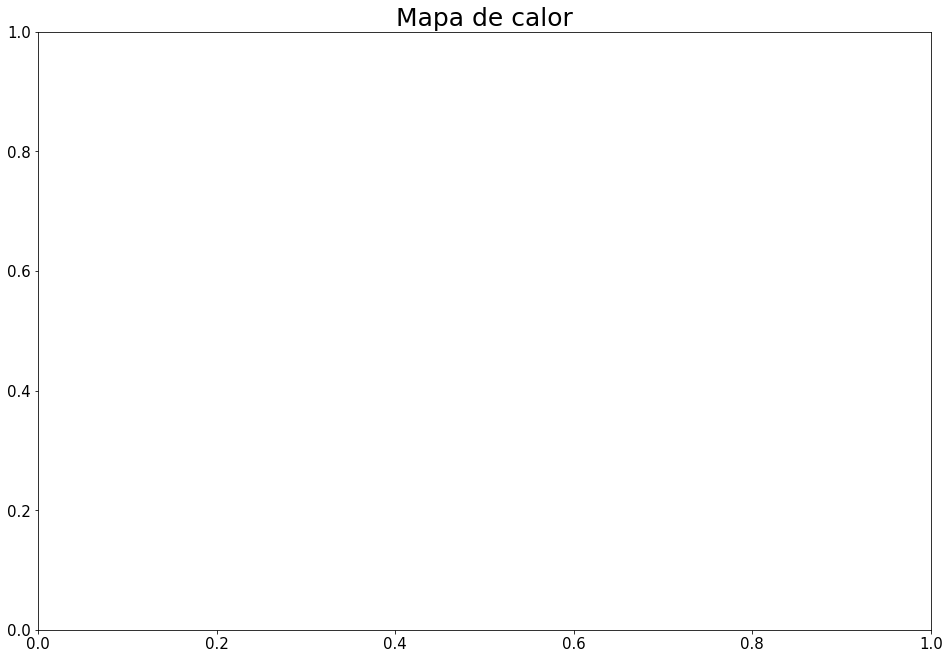

In [242]:
# Criar o mapa de calor
corr = df3.corr(method='pearson')
fig, ax = plt.subplots(figsize=(16, 11))

# Configura o título e os eixos
ax.set_title('Mapa de calor', fontsize=25)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=15)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=15)

# Plota e mostra o gráfico
ax = sns.heatmap(corr, annot=True, cmap='Reds', ax=ax)
plt.show()

# 4. DATA PREPARATION

In [583]:
df4 = df3.copy()
df_teste_dt = df_teste.copy()
df4['week_of_year'] = df4['week_of_year'].astype(int)
df_teste['week_of_year'] = df_teste['week_of_year'].astype(int)
df4.columns

Index(['id', 'loja', 'setor', 'data', 'vendas_semanais', 'feriado', 'tipo',
       'tamanho', 'temperatura', 'combustivel', 'desemprego',
       'distancia_competidores', 'clientes', 'week_of_year', 'week_of_month',
       'month', 'day', 'tipo_de_loja', 'desconto'],
      dtype='object')

## 4.1 Variáveis Numéricas

In [584]:
mm = pp.MinMaxScaler() #Mantem a mesma distribuição, com outro shape, e colocando de 0 a 1
ss = pp.StandardScaler() #Rescala os dados
rs = pp.RobustScaler()

df4['tamanho'] = ss.fit_transform(df4[['tamanho']])
df4['temperatura'] = ss.fit_transform(df4[['temperatura']])
#df4['combustivel'] = ss.fit_transform(df4[['combustivel']])
df4['desconto'] = mm.fit_transform(df4[['desconto']])
#df4['desconto_1'] = mm.fit_transform(df4[['desconto_1']])
#df4['desconto_2'] = mm.fit_transform(df4[['desconto_2']])
#df4['desconto_3'] = mm.fit_transform(df4[['desconto_3']])
#df4['desconto_4'] = mm.fit_transform(df4[['desconto_4']])
#df4['desconto_5'] = mm.fit_transform(df4[['desconto_5']])
#df4['desemprego'] = ss.fit_transform(df4[['desemprego']])
df4['distancia_competidores'] = rs.fit_transform(df4[['distancia_competidores']])
df4['week_of_year'] = mm.fit_transform(df4[['week_of_year']])
#df4['month'] = mm.fit_transform(df4[['month']])
df4['clientes'] = mm.fit_transform(df4[['clientes']])
#df4['setor'] = mm.fit_transform(df4[['setor']])

df_teste_dt['tamanho'] = ss.fit_transform(df_teste_dt[['tamanho']])
df_teste_dt['temperatura'] = ss.fit_transform(df_teste_dt[['temperatura']])
#df_teste_dt['combustivel'] = ss.fit_transform(df_teste_dt[['combustivel']])
df_teste_dt['desconto'] = mm.fit_transform(df_teste_dt[['desconto']])
#df_teste_dt['desconto_1'] = mm.fit_transform(df_teste_dt[['desconto_1']])
#df_teste_dt['desconto_2'] = mm.fit_transform(df_teste_dt[['desconto_2']])
#df_teste_dt['desconto_3'] = mm.fit_transform(df_teste_dt[['desconto_3']])
#df_teste_dt['desconto_4'] = mm.fit_transform(df_teste_dt[['desconto_4']])
#df_teste_dt['desconto_5'] = mm.fit_transform(df_teste_dt[['desconto_5']])
#df_teste_dt['desemprego'] = ss.fit_transform(df_teste_dt[['desemprego']])
df_teste_dt['distancia_competidores'] = rs.fit_transform(df_teste_dt[['distancia_competidores']])
df_teste_dt['week_of_year'] = mm.fit_transform(df_teste_dt[['week_of_year']])
#df_teste_dt['month'] = mm.fit_transform(df_teste_dt[['month']])
df_teste_dt['clientes'] = mm.fit_transform(df_teste_dt[['clientes']])
#df_teste_dt['setor'] = mm.fit_transform(df_teste_dt[['setor']])

## 4.2 Variáveis Categóricas

In [585]:
#'setor'
#'loja'
#'economia' - One Hot Encoding
#df4 = pd.get_dummies(df4,prefix=['economia'],dtype='int64',columns=['economia'])
#df_teste_dt = pd.get_dummies(df_teste_dt,prefix=['economia'],dtype='int64',columns=['economia'])

#'feriado' - One Hot Encoding
df4 = pd.get_dummies(df4,prefix=['feriado'],dtype='int64',columns=['feriado'])
df_teste_dt = pd.get_dummies(df_teste_dt,prefix=['feriado'],dtype='int64',columns=['feriado'])

#'tipo' - Label Encoding
le = pp.LabelEncoder()
df4['tipo'] = le.fit_transform(df4['tipo'])
df_teste_dt['tipo'] = le.fit_transform(df_teste_dt['tipo'])


#'tipo_de_loja' - One Hot Encoding
df4 = pd.get_dummies(df4,prefix=['tipo_de_loja'],dtype='int64',columns=['tipo_de_loja'])
df_teste_dt = pd.get_dummies(df_teste_dt,prefix=['tipo_de_loja'],dtype='int64',columns=['tipo_de_loja'])

#'tipo_de_loja' - Ordinal Encoding
# Criar uma instância do OrdinalEncoder
#encoder = pp.OrdinalEncoder(categories=[['A', 'B', 'C']], dtype=int)
# Ajustar e transformar os dados
#df4['tipo_de_loja'] = encoder.fit_transform(df4[['tipo_de_loja']])
#df_teste_dt['tipo_de_loja'] = encoder.fit_transform(df_teste_dt[['tipo_de_loja']])

# Encoding para week_of_month
df4['week_of_month_sin'] = df4['week_of_month'].apply(lambda x: np.sin(x * (2 * np.pi / 4))) 
df4['week_of_month_cos'] = df4['week_of_month'].apply(lambda x: np.cos(x * (2 * np.pi / 4)))
df4 = df4.drop(['week_of_month'],axis=1)
df_teste_dt['week_of_month_sin'] = df_teste_dt['week_of_month'].apply(lambda x: np.sin(x * (2 * np.pi / 4))) 
df_teste_dt['week_of_month_cos'] = df_teste_dt['week_of_month'].apply(lambda x: np.cos(x * (2 * np.pi / 4)))
df_teste_dt = df_teste_dt.drop(['week_of_month'],axis=1)

# Encoding para day
df4['day_sin'] = df4['day'].apply(lambda x: np.sin(x * (2 * np.pi / 30))) 
df4['day_cos'] = df4['day'].apply(lambda x: np.cos(x * (2 * np.pi / 30)))
df4 = df4.drop(['day'],axis=1)
df_teste_dt['day_sin'] = df_teste_dt['day'].apply(lambda x: np.sin(x * (2 * np.pi / 30))) 
df_teste_dt['day_cos'] = df_teste_dt['day'].apply(lambda x: np.cos(x * (2 * np.pi / 30)))
df_teste_dt = df_teste_dt.drop(['day'],axis=1)

## 4.3 Normalização do Fenômeno

In [586]:
#Normalizando o fenômeno
df4['vendas_semanais'] = np.log1p(df4['vendas_semanais'])

In [587]:
df4['vendas_semanais'].describe()

count    121996.000000
mean          8.788319
std           2.277845
min           0.693147
25%           7.734358
50%           9.025337
75%          10.074541
max          13.815479
Name: vendas_semanais, dtype: float64

In [588]:
df_teste_dt.head()

,id,loja,setor,data,tipo,tamanho,temperatura,combustivel,desemprego,distancia_competidores,...,desconto,feriado_0,feriado_1,tipo_de_loja_A,tipo_de_loja_B,tipo_de_loja_C,week_of_month_sin,week_of_month_cos,day_sin,day_cos
0,276064,20,16,2023-11-25,0,-0.061911,-0.145783,3.492,0.07082,-0.328276,...,0.726489,0,1,0,1,0,-2.449294e-16,1.0,-0.866025,0.5
1,276390,20,19,2023-11-25,0,-0.061911,-0.145783,3.492,0.07082,-0.328276,...,0.726489,0,1,0,1,0,-2.449294e-16,1.0,-0.866025,0.5
2,276446,20,3,2023-11-25,0,-0.061911,-0.145783,3.492,0.07082,-0.328276,...,0.726489,0,1,0,1,0,-2.449294e-16,1.0,-0.866025,0.5
3,276596,20,1,2023-11-25,0,-0.061911,-0.145783,3.492,0.07082,-0.328276,...,0.726489,0,1,0,1,0,-2.449294e-16,1.0,-0.866025,0.5
4,276662,20,18,2023-11-25,0,-0.061911,-0.145783,3.492,0.07082,-0.328276,...,0.726489,0,1,0,1,0,-2.449294e-16,1.0,-0.866025,0.5


# 5. FEATURE SELECTION

In [589]:
df5 = df4.copy()
#data preparation
x_train_n = df5.drop(['id','vendas_semanais','data'],axis=1)
y_train_n = df5['vendas_semanais']

## 5.1 Feature Importance

In [316]:
#model definition
forest = en.ExtraTreesRegressor(n_estimators=100, random_state=0,n_jobs=-1)

forest.fit(x_train_n,y_train_n)

ExtraTreesRegressor(n_jobs=-1, random_state=0)

Feature Ranking
                  feature  importance
0                   setor    0.548836
0                    tipo    0.054923
0                 tamanho    0.049064
0                clientes    0.039250
0             temperatura    0.037930
0             combustivel    0.035132
0                    loja    0.034814
0              desemprego    0.034654
0            week_of_year    0.032838
0                   month    0.028862
0                 day_sin    0.026472
0                 day_cos    0.025539
0       week_of_month_sin    0.014032
0       week_of_month_cos    0.013741
0            tipo_de_loja    0.013544
0                desconto    0.002873
0  distancia_competidores    0.002737
0               feriado_1    0.002415
0               feriado_0    0.002345


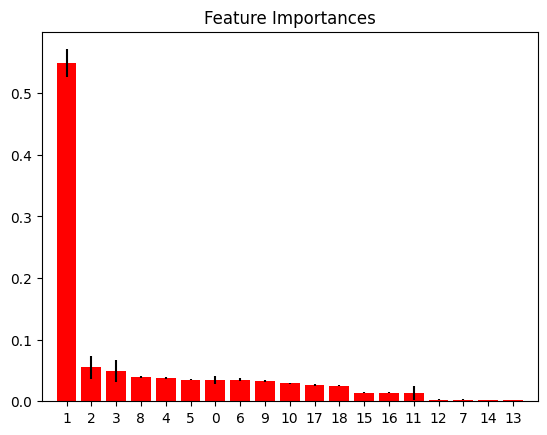

In [317]:
importances = forest.feature_importances_ #Salva as importâncias das features
std = np.std([tree.feature_importances_ for tree in forest.estimators_],axis=0)
indices = np.argsort(importances)[::-1] #Importâncias das árvores ordenadas pelo maior valor

#print the feature ranking
print('Feature Ranking')
df = pd.DataFrame()
for i,j in zip(x_train_n,forest.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j},index=[0])
    df = pd.concat([df,aux],axis=0)
    
print(df.sort_values('importance',ascending=False))

#Plot the impurity-based feature importances of the forest
plt.figure()
plt.title('Feature Importances')
plt.bar(range(x_train_n.shape[1]),importances[indices],color='r',yerr=std[indices],align='center')
plt.xticks(range(x_train_n.shape[1]),indices)
plt.xlim([-1,x_train_n.shape[1]])
plt.show()

In [138]:
#cols = ['id','data','setor','clientes','week_of_year','temperatura','combustivel','desemprego','loja','tamanho','vendas_semanais']
#df5 = df5[cols]

## 5.2. Split dataframe into training and test

In [590]:
from datetime import datetime, timedelta

# Definir as datas
data_inicial = datetime.strptime('2023-01-07', '%Y-%m-%d')
data_final = datetime.strptime('2023-11-18', '%Y-%m-%d')

# Calcular a diferença em dias
diferenca_dias = (data_final - data_inicial).days

# Calcular 80% da diferença em dias
dias_limite = diferenca_dias * 0.8

# Somar a data inicial com os dias limite
data_limite = data_inicial + timedelta(days=dias_limite)

# Exibir a data limite
print(f'A data limite é: {data_limite.strftime("%Y-%m-%d")}')

A data limite é: 2023-09-16


In [591]:
# Definir os limites de datas
limite_data_teste = '2023-09-16'

# Definir o dataset de treino
X_train_full_FUll = df5.copy()
Y_train_full = X_train_full_FUll['vendas_semanais']

# Definir o dataset de treino
X_train_full = df5[df5['data'] < limite_data_teste]
Y_train = X_train_full['vendas_semanais']

# Definir o dataset de teste
X_test_full = df5[df5['data'] >= limite_data_teste]
Y_test = X_test_full['vendas_semanais']

# Exibir os limites de datas
min_xtrain = X_train_full['data'].min()
max_xtrain = X_train_full['data'].max()

min_xtest = X_test_full['data'].min()
max_xtest = X_test_full['data'].max()

print(f'Limites do X_train: {min_xtrain} - {max_xtrain}')
print(f'Limites do X_test: {min_xtest} - {max_xtest}')

Limites do X_train: 2023-01-07 00:00:00 - 2023-09-09 00:00:00
Limites do X_test: 2023-09-16 00:00:00 - 2023-11-18 00:00:00


# 6. MACHINE LEARNING MODELING

In [592]:
X_train = X_train_full.drop(['id','vendas_semanais','data'],axis=1)
X_test = X_test_full.drop(['id','vendas_semanais','data'],axis=1)

## 6.1. Treinar, testar e medir

### 6.1.1 Linear Regression

In [472]:
# Criar uma instância do modelo de regressão linear
modelo_regressao = LinearRegression()

# Treinar o modelo com os dados de treinamento
modelo_regressao.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes = modelo_regressao.predict(X_test)

# Calcular o RMSE
rmse = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes)))
print(f"Root Mean Squared Error (RMSE): {rmse}")

Root Mean Squared Error (RMSE): 202273.8029699082


In [322]:
lr_cv = cross_validation(X_train_full,5,'Linear Regression',modelo_regressao,verbose=True)
lr_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,Linear Regression,208452.21 +/- 1277.97


### 6.1.2 Lasso

In [323]:
# Criar uma instância do modelo Lasso
modelo_lasso = Lasso(alpha=1.0, random_state=42)

# Treinar o modelo com os dados de treinamento
modelo_lasso.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_lasso = modelo_lasso.predict(X_test)

# Calcular o RMSE
rmse_lasso = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_lasso)))
print(f"Root Mean Squared Error (RMSE) para Regressão Lasso: {rmse_lasso}")

Root Mean Squared Error (RMSE) para Regressão Lasso: 202701.18127561567


In [324]:
lasso_cv = cross_validation(X_train_full,5,'Linear Regression - Lasso',modelo_lasso,verbose=True)
lasso_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,Linear Regression - Lasso,208847.92 +/- 1230.44


### 6.1.3 Random Forest

In [325]:
# Criar uma instância do modelo de Random Forest
modelo_random_forest = en.RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)

# Treinar o modelo com os dados de treinamento
modelo_random_forest.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_rf = modelo_random_forest.predict(X_test)

# Calcular o RMSE
rmse_rf = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_rf)))
print(f"Root Mean Squared Error (RMSE) para Random Forest: {rmse_rf}")
#198359.4994965211

Root Mean Squared Error (RMSE) para Random Forest: 198313.21383134715


In [326]:
rf_cv = cross_validation(X_train_full,5,'Random Forest',modelo_random_forest,verbose=True)
rf_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,Random Forest,205116.77 +/- 1351.21


### 6.1.4 XGBoost

In [327]:
# Criar uma instância do modelo XGBoost
modelo_xgboost = XGBRegressor(n_estimators=100, random_state=42)

# Treinar o modelo com os dados de treinamento
modelo_xgboost.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_xgboost = modelo_xgboost.predict(X_test)

# Calcular o RMSE
rmse_xgboost = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_xgboost)))
print(f"Root Mean Squared Error (RMSE) para XGBoost: {rmse_xgboost}")

Root Mean Squared Error (RMSE) para XGBoost: 198807.6243963654


In [328]:
xgb_cv = cross_validation(X_train_full,5,'XGBoost',modelo_xgboost,verbose=True)
xgb_cv

K = 5


K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,XGBoost,206277.95 +/- 1217.86


### 6.1.5 LGBM Model

In [329]:
# Criar uma instância do modelo LightGBM
modelo_lgbm = LGBMRegressor(n_estimators=100, random_state=42)

# Treinar o modelo com os dados de treinamento
modelo_lgbm.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_lgbm = modelo_lgbm.predict(X_test)

# Calcular o RMSE
rmse_lgbm = np.sqrt(mean_squared_error(np.expm1(Y_test),np.expm1( previsoes_lgbm)))
print(f"Root Mean Squared Error (RMSE) para LightGBM: {rmse_lgbm}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1092
[LightGBM] [Info] Number of data points in the train set: 95385, number of used features: 17
[LightGBM] [Info] Start training from score 8.787567
Root Mean Squared Error (RMSE) para LightGBM: 199270.00518334212


In [330]:
lgbm_cv = cross_validation(X_train_full,5,'LGBM Model',modelo_lgbm,verbose=True)
lgbm_cv

K = 5
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 13211, number of used features: 15
[LightGBM] [Info] Start training from score 8.684756
K = 4
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001778 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 757
[LightGBM] [Info] Number of data points in the train set: 29213, number of used features: 17
[LightGBM] [Info] Start training from score 8.760524
K = 3
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if mem

,Model Name,RSME CV
0,LGBM Model,205633.29 +/- 1230.67


### 6.1.6 Elastic Net

In [331]:
# Criar uma instância do modelo Elastic Net
modelo_elasticnet = ElasticNet(alpha=1.0, l1_ratio=0.5, random_state=42)

# Treinar o modelo com os dados de treinamento
modelo_elasticnet.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_elasticnet = modelo_elasticnet.predict(X_test)

# Calcular o RMSE
rmse_elasticnet = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_elasticnet)))
print(f"Root Mean Squared Error (RMSE) para Elastic Net: {rmse_elasticnet}")

Root Mean Squared Error (RMSE) para Elastic Net: 202684.0419498248


In [332]:
elastic_cv = cross_validation(X_train_full,5,'Elastic Net',modelo_elasticnet,verbose=True)
elastic_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,Elastic Net,208830.75 +/- 1230.47


### 6.1.7 Support Vector Regression

### 6.1.8 K-Nearest Neighbors (KNN) Regression

In [333]:
# Criar uma instância do modelo KNN Regressor
modelo_knn = KNeighborsRegressor(n_neighbors=7)  # O número de vizinhos (n_neighbors) é um exemplo, ajuste conforme necessário

# Treinar o modelo com os dados de treinamento
modelo_knn.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_knn = modelo_knn.predict(X_test)

# Calcular o RMSE
rmse_knn = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_knn)))
print(f"Root Mean Squared Error (RMSE) para K-Nearest Neighbors Regression: {rmse_knn}")

Root Mean Squared Error (RMSE) para K-Nearest Neighbors Regression: 199474.98558186632


In [334]:
knn_cv = cross_validation(X_train_full,5,'KNN',modelo_knn,verbose=True)
knn_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,KNN,206082.58 +/- 1205.22


### 6.1.9 Ridge

In [335]:
# Criar uma instância do modelo Ridge
modelo_ridge = Ridge(alpha=1.0, random_state=42)

# Treinar o modelo com os dados de treinamento
modelo_ridge.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_ridge = modelo_ridge.predict(X_test)

# Calcular o RMSE
rmse_ridge = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_ridge)))
print(f"Root Mean Squared Error (RMSE) para Ridge Regression: {rmse_ridge}")

Root Mean Squared Error (RMSE) para Ridge Regression: 202307.88667590788


In [336]:
ridge_cv = cross_validation(X_train_full,5,'Ridge',modelo_ridge,verbose=True)
ridge_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,Ridge,208446.42 +/- 1286.18


### 6.1.10 Gradient Boosting Regressor

In [337]:
# Criar uma instância do modelo Gradient Boosting Regressor
modelo_gradient_boosting = GradientBoostingRegressor(n_estimators=250, random_state=42)

# Treinar o modelo com os dados de treinamento
modelo_gradient_boosting.fit(X_train, Y_train)

# Fazer previsões no conjunto de teste
previsoes_gradient_boosting = modelo_gradient_boosting.predict(X_test)

# Calcular o RMSE
rmse_gradient_boosting = np.sqrt(mean_squared_error(np.expm1(Y_test), np.expm1(previsoes_gradient_boosting)))
print(f"Root Mean Squared Error (RMSE) para Gradient Boosting Regressor: {rmse_gradient_boosting}")

Root Mean Squared Error (RMSE) para Gradient Boosting Regressor: 199476.16527895094


In [338]:
gbr_cv = cross_validation(X_train_full,5,'GBR',modelo_gradient_boosting,verbose=True)
gbr_cv

K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,GBR,205817.42 +/- 1223.24


### Resultados

In [339]:
#features - Economia e tirando linhas com poucos clientes
pd.concat([lr_cv,lasso_cv,rf_cv,xgb_cv,lgbm_cv,elastic_cv,knn_cv,ridge_cv,gbr_cv])

,Model Name,RSME CV
0,Linear Regression,208452.21 +/- 1277.97
0,Linear Regression - Lasso,208847.92 +/- 1230.44
0,Random Forest,205116.77 +/- 1351.21
0,XGBoost,206277.95 +/- 1217.86
0,LGBM Model,205633.29 +/- 1230.67
0,Elastic Net,208830.75 +/- 1230.47
0,KNN,206082.58 +/- 1205.22
0,Ridge,208446.42 +/- 1286.18
0,GBR,205817.42 +/- 1223.24


In [387]:
#nova variavel
pd.concat([lr_cv,lasso_cv,rf_cv,xgb_cv,lgbm_cv,elastic_cv,knn_cv,ridge_cv,gbr_cv])

,Model Name,RSME CV
0,Linear Regression,208400.41 +/- 1312.99
0,Linear Regression - Lasso,208847.92 +/- 1230.44
0,Random Forest,205239.87 +/- 1287.8
0,XGBoost,206155.16 +/- 1100.3
0,LGBM Model,205605.11 +/- 1274.4
0,Elastic Net,208830.75 +/- 1230.47
0,KNN,205900.92 +/- 1216.28
0,Ridge,208404.21 +/- 1312.95
0,GBR,205796.22 +/- 1292.69


## 6.2. Validar métricas

In [340]:
# Definindo parâmetros aleatórios para o Random Search
param_rf = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

max_eval = 5

In [341]:
# Armazenar os resultados
final_result = pd.DataFrame()

for i in range(max_eval):
    # Escolher valores para parâmetros aleatoriamente
    hp_rf = {k: random.sample(v, 1)[0] for k, v in param_rf.items()}
    print(hp_rf)
    
    # Criar uma instância do modelo Random Forest
    modelo_random_forest = en.RandomForestRegressor(
        n_estimators=hp_rf['n_estimators'],
        max_depth=hp_rf['max_depth'],
        min_samples_split=hp_rf['min_samples_split'],
        min_samples_leaf=hp_rf['min_samples_leaf'],
        max_features=hp_rf['max_features'],
        random_state=42,
        n_jobs=-1
    )

    # Performance usando cross-validation
    result = cross_validation(X_train_full_FUll,5,f'Random Forest: {i+1}',modelo_random_forest,verbose=True)

    final_result = pd.concat([final_result,result])

final_result



{'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
K = 5
K = 4
K = 3
K = 2
K = 1
{'n_estimators': 200, 'max_depth': 30, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
K = 5
K = 4
K = 3
K = 2
K = 1
{'n_estimators': 500, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}
K = 5
K = 4
K = 3
K = 2
K = 1
{'n_estimators': 500, 'max_depth': None, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None}
K = 5
K = 4
K = 3
K = 2
K = 1
{'n_estimators': 500, 'max_depth': 40, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
K = 5
K = 4
K = 3
K = 2
K = 1


,Model Name,RSME CV
0,Random Forest: 1,205209.13 +/- 3692.79
0,Random Forest: 2,202276.52 +/- 3868.66
0,Random Forest: 3,204265.7 +/- 3729.0
0,Random Forest: 4,201991.78 +/- 3722.15
0,Random Forest: 5,204147.53 +/- 3748.69


In [626]:
final_result

,Model Name,RSME CV
0,Random Forest: 1,205194.58 +/- 3737.48
0,Random Forest: 2,202019.44 +/- 3830.17
0,Random Forest: 3,205189.05 +/- 3705.15
0,Random Forest: 4,202916.27 +/- 3822.6
0,Random Forest: 5,202397.98 +/- 3846.22


In [601]:
# Definindo parâmetros aleatórios para o Random Search
param_lgbm = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [5, 10, 15, 20, -1],  # -1 indica sem limite de profundidade
    'learning_rate': [0.5, 0.4, 0.3],
    'num_leaves': [31, 50, 75, 100, 150],
    'subsample': [0.8],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'min_child_samples': [10, 20, 30, 40, 50]
}

max_eval = 10

In [602]:
# Armazenar os resultados
final_result = pd.DataFrame()

for i in range(max_eval):
    # Escolher valores para parâmetros aleatoriamente
    hp_rf = {k: random.sample(v, 1)[0] for k, v in param_lgbm.items()}
    print(hp_rf)
    
    # Criar uma instância do modelo LGBMRegressor
    modelo_lgbm = LGBMRegressor(
        n_estimators=hp_rf['n_estimators'],
        max_depth=hp_rf['max_depth'],
        learning_rate=hp_rf['learning_rate'],
        num_leaves=hp_rf['num_leaves'],
        subsample=hp_rf['subsample'],
        colsample_bytree=hp_rf['colsample_bytree'],
        min_child_samples=hp_rf['min_child_samples'],
        random_state=42,
        n_jobs=-1
    )

    # Performance usando cross-validation
    result = cross_validation(X_train_full_FUll,5,f'LGBM: {i+1}',modelo_lgbm,verbose=True)

    final_result = pd.concat([final_result,result])

final_result

{'n_estimators': 200, 'max_depth': 15, 'learning_rate': 0.4, 'num_leaves': 100, 'subsample': 0.8, 'colsample_bytree': 0.9, 'min_child_samples': 30}
K = 5
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 861
[LightGBM] [Info] Number of data points in the train set: 39841, number of used features: 19
[LightGBM] [Info] Start training from score 8.769777


K = 4
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 955
[LightGBM] [Info] Number of data points in the train set: 55795, number of used features: 19
[LightGBM] [Info] Start training from score 8.774998
K = 3
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1053
[LightGBM] [Info] Number of data points in the train set: 71538, number of used features: 19
[LightGBM] [Info] Start training from score 8.793933
K = 2
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if me

,Model Name,RSME CV
0,LGBM: 1,202489.32 +/- 3768.54
0,LGBM: 2,202565.95 +/- 3751.78
0,LGBM: 3,202564.68 +/- 3742.76
0,LGBM: 4,202655.39 +/- 3722.08
0,LGBM: 5,202786.77 +/- 3866.93
0,LGBM: 6,202604.86 +/- 3723.2
0,LGBM: 7,202566.91 +/- 3785.21
0,LGBM: 8,202509.83 +/- 3791.22
0,LGBM: 9,202520.68 +/- 3786.85
0,LGBM: 10,202615.84 +/- 3717.83


In [354]:
final_result

,Model Name,RSME CV
0,LGBM: 1,203056.81 +/- 3742.61
0,LGBM: 2,205478.04 +/- 3743.66
0,LGBM: 3,202457.8 +/- 3767.61
0,LGBM: 4,204101.13 +/- 3758.2
0,LGBM: 5,202534.03 +/- 3740.42


In [615]:
param_lgbm = {
    'n_estimators': 200,
    'max_depth': 15,  # -1 indica sem limite de profundidade
    'learning_rate': 0.2,
    'num_leaves': 100,
    'subsample': 0.8,
    'colsample_bytree': 0.9,
    'min_child_samples': 20
}

In [616]:
modelo_lgbm = LGBMRegressor(
        n_estimators=param_lgbm['n_estimators'],
        max_depth=param_lgbm['max_depth'],
        learning_rate=param_lgbm['learning_rate'],
        num_leaves=param_lgbm['num_leaves'],
        subsample=param_lgbm['subsample'],
        colsample_bytree=param_lgbm['colsample_bytree'],
        min_child_samples=param_lgbm['min_child_samples'],
        n_jobs=-1
    )

# Treinar o modelo com os dados de treinamento
modelo_lgbm.fit(X_train_full_FUll.drop(['id','vendas_semanais','data'],axis=1), Y_train_full)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1323
[LightGBM] [Info] Number of data points in the train set: 121996, number of used features: 21
[LightGBM] [Info] Start training from score 8.788319


LGBMRegressor(colsample_bytree=0.9, learning_rate=0.2, max_depth=15,
              n_estimators=200, n_jobs=-1, num_leaves=100, subsample=0.8)

In [ ]:
# Criar uma instância do modelo de Random Forest
modelo_random_forest = en.RandomForestRegressor(
        n_estimators=param_rf['n_estimators'],
        max_depth=param_rf['max_depth'],
        min_samples_split=param_rf['min_samples_split'],
        min_samples_leaf=param_rf['min_samples_leaf'],
        max_features=param_rf['max_features'],
        random_state=42,
        n_jobs=-1
    )

# Treinar o modelo com os dados de treinamento
modelo_random_forest.fit(X_train_full_FUll.drop(['id','vendas_semanais','data'],axis=1), Y_train_full)

In [342]:
param_rf = {
    'n_estimators': 500,
    'max_depth': None,
    'min_samples_split': 5,
    'min_samples_leaf': 2,
    'max_features': None
}

In [343]:
# Criar uma instância do modelo de Random Forest
modelo_random_forest = en.RandomForestRegressor(
        n_estimators=param_rf['n_estimators'],
        max_depth=param_rf['max_depth'],
        min_samples_split=param_rf['min_samples_split'],
        min_samples_leaf=param_rf['min_samples_leaf'],
        max_features=param_rf['max_features'],
        random_state=42,
        n_jobs=-1
    )

# Treinar o modelo com os dados de treinamento
modelo_random_forest.fit(X_train_full_FUll.drop(['id','vendas_semanais','data'],axis=1), Y_train_full)

RandomForestRegressor(max_features=None, min_samples_leaf=2,
                      min_samples_split=5, n_estimators=500, n_jobs=-1,
                      random_state=42)

# 7. ERROR TRANSLATION AND INTERPRETATION

# 8. DEPLOY / SUBMISSION

In [617]:
teste = df_teste_dt.drop(['id','data'],axis=1)
y_hat_test = modelo_lgbm.predict(teste)

In [618]:
final_test = pd.concat([df_teste_dt, pd.Series(np.expm1(y_hat_test), name='vendas_semanais')], axis=1)

final_test[['id', 'vendas_semanais']].sort_values('id',ascending=True).to_csv('submission2_18.csv', index=False)